# Derivados Financieros 2023 - [material previo a Clase 3 1/2]

## Menu del dia:

    - (1) Web scraping de pginas de opciones
    - (2) Limpieza y generacion de dataframe ad-hoc para futuros usos
    - (3) pyhomebroker (requiere acceso a ALyC que use HomeBroker) - NO SOPORTADO 2023
    - (4) algunos plots de market data de opciones
    - (5) exportar a exel/csv 
    - (6) Comparar paneles (rava-hb) - NO SOPORTADO 2023
    
    

## (1) Web Scraping de la pagina de IOL

Modulos necesarios

data_byma (en webcampus) ;

utils_opciones_byma (en webcampus)

bs4,

requests,

pandas,

matplotlib,

datetime,

calendar,

sys,

Instalarlos con Anaconda, comando Conda o comando pip install

### Importo los modulos

In [44]:

import sys

sys.path.append('../..')
from Codigo.data import *
from Codigo.utils import *



### Metodo para el web scraping

In [45]:
panel_opciones = web_scraping_opciones_iol()
panel_opciones.head(20)

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado
0,ALUC155.AG,280.000,320.00,280.00,320.00,280.000,18697370.0
1,ALUC170.AG,286.440,286.44,274.95,286.44,286.440,167918.0
2,ALUC175.AG,252.980,252.98,252.98,252.98,252.980,0.0
3,ALUC190.AG,280.920,293.92,280.92,293.92,280.920,0.0
4,ALUC190.OC,282.000,293.00,280.00,293.00,282.000,16769502.0
5,ALUC200.AG,100.000,100.00,100.00,100.00,100.000,0.0
6,ALUC210.AG,218.370,218.37,218.37,218.37,218.370,0.0
7,ALUC215.AG,265.530,265.53,265.53,265.53,265.530,0.0
8,ALUC245.AG,222.530,222.53,222.53,222.53,222.530,0.0
9,ALUC255.AG,219.000,219.00,219.00,219.00,219.000,0.0


### Que hace internamente el metodo??

#### Beautiful Soup /requests 


Mas sobre BS4: https://j2logo.com/python/web-scraping-con-python-guia-inicio-beautifulsoup/

Mas sobre requests: https://www.digitalocean.com/community/tutorials/how-to-get-started-with-the-requests-library-in-python-es

In [3]:
from bs4 import BeautifulSoup
import requests
import pandas as pd

#### Como usamos BeautifulSoup y requests

In [4]:
#url = 'http://www.rava.com/precios/panel.php?m=OPC'
#url = 'http://clasico.rava.com/precios/panel.php?m=OPC'
#url = 'http://datos.rava.com/cotizaciones/opciones'
url = 'https://iol.invertironline.com/mercado/cotizaciones/argentina/opciones/todas'


page = requests.get(url)
page

<Response [200]>

In [5]:
# En soup voy a encontrar el codigo html de la pagina

soup = BeautifulSoup(page.text, 'lxml')
soup

<!DOCTYPE html>
<!-- paulirish.com/2008/conditional-stylesheets-vs-css-hacks-answer-neither/ --><!--[if lt IE 7]> <html class="no-js lt-ie9 lt-ie8 lt-ie7" lang="es"> <![endif]--><!--[if IE 7]>    <html class="no-js lt-ie9 lt-ie8" lang="es"> <![endif]--><!--[if IE 8]>    <html class="no-js lt-ie9" lang="es"> <![endif]--><!-- Consider adding a manifest.appcache: h5bp.com/d/Offline --><!--[if gt IE 8]><!--><html class="no-js" lang="es">
<!--<![endif]-->
<head>
<link href="/manifest.json" rel="manifest"/>
<script src="/bundles/Notificaciones?v=nos3x6dneV7Zyj4sDet4Cz2xfCqwf3DRHCvUZmsTHx81"></script>
<script async="" src="https://cdn.onesignal.com/sdks/OneSignalSDK.js"></script>
<script>
        var OneSignal = window.OneSignal || [];
        //InicializarOneSignal("3560fafb-4e99-483c-9b21-2691d01b689f", "", false, "web.onesignal.auto.47a2f439-afd3-4bb7-8cdd-92cc4f5ee46c");

        function lazyOneSignal(){
        	//InicializarOneSignal("3560fafb-4e99-483c-9b21-2691d01b689f", "", false, "

#### El arte del scraping

Aqui es donde uno tiene que meterse en el codigo interno de la pagina e 'identificar' la informacion que necesita. En este caso la tabla de informacion de opciones
Se puede hacer una inspeccion en modo dev del navegador


In [6]:
# En opciones tengo el contenido de la tabla correspondiente

opciones = soup.find('table', {'id': 'cotizaciones'})
opciones

<table class="table table-striped theadh36 table-hover fs12 middleContent cotizacionestb row" id="cotizaciones">
<thead>
<tr class="text-center dthead">
<td>Símbolo</td>
<td>Último<br/>Operado</td>
<td>Variación<br/>Diaria</td>
<td>Cantidad<br/>Compra</td>
<td>Precio<br/>Compra</td>
<td>Precio<br/>Venta</td>
<td>Cantidad<br/>Venta</td>
<td>Apertura</td>
<td>Mínimo</td>
<td>Máximo</td>
<td>Último<br/>Cierre</td>
<td>Monto<br/>Operado</td>
<td class="noarrow"></td>
</tr>
</thead>
<tbody>
<tr data-cantidad="1" data-tituloid="126257-">
<td class="tal links up mw145" data-field="IDTitulo" data-quotestyle='{"ValueChange": false, "flash":"no", "CssChange":true }'>
<i class="icono-simbolo mr10 fl aluc155.ag" data-placement="top" data-toggle="tooltip"></i>
<a data-placement="top" data-symbol="ALUC155.AG" data-toggle="tooltip" data-url="/Titulo/Index/126257" href="/Titulo/Index/126257">
<b>
                                ALUC155.AG
                            </b>
<br/>
<span style="font-size: 

#### Aqui continua el detalle. Se identifican las filas de la tabla. *tr* sera el separador que va empezando y cerrando las filas

In [7]:
# Filas ya va ordenando cada una de las opciones


filas = opciones.find_all('tr')
filas

[<tr class="text-center dthead">
 <td>Símbolo</td>
 <td>Último<br/>Operado</td>
 <td>Variación<br/>Diaria</td>
 <td>Cantidad<br/>Compra</td>
 <td>Precio<br/>Compra</td>
 <td>Precio<br/>Venta</td>
 <td>Cantidad<br/>Venta</td>
 <td>Apertura</td>
 <td>Mínimo</td>
 <td>Máximo</td>
 <td>Último<br/>Cierre</td>
 <td>Monto<br/>Operado</td>
 <td class="noarrow"></td>
 </tr>,
 <tr data-cantidad="1" data-tituloid="126257-">
 <td class="tal links up mw145" data-field="IDTitulo" data-quotestyle='{"ValueChange": false, "flash":"no", "CssChange":true }'>
 <i class="icono-simbolo mr10 fl aluc155.ag" data-placement="top" data-toggle="tooltip"></i>
 <a data-placement="top" data-symbol="ALUC155.AG" data-toggle="tooltip" data-url="/Titulo/Index/126257" href="/Titulo/Index/126257">
 <b>
                                 ALUC155.AG
                             </b>
 <br/>
 <span style="font-size: 11px;">
 </span>
 </a>
 </td>
 <td class="right tar" data-field="UltimoPrecio" data-order="315,000" data-quotesty

#### Identifico la primera linea, la de los -headers- de la tabla

In [8]:
tr = filas[0]
tr

<tr class="text-center dthead">
<td>Símbolo</td>
<td>Último<br/>Operado</td>
<td>Variación<br/>Diaria</td>
<td>Cantidad<br/>Compra</td>
<td>Precio<br/>Compra</td>
<td>Precio<br/>Venta</td>
<td>Cantidad<br/>Venta</td>
<td>Apertura</td>
<td>Mínimo</td>
<td>Máximo</td>
<td>Último<br/>Cierre</td>
<td>Monto<br/>Operado</td>
<td class="noarrow"></td>
</tr>

#### Identifico cada columna dentro de la fila con el marcador td


In [9]:
td = tr.find_all('td')
td


[<td>Símbolo</td>,
 <td>Último<br/>Operado</td>,
 <td>Variación<br/>Diaria</td>,
 <td>Cantidad<br/>Compra</td>,
 <td>Precio<br/>Compra</td>,
 <td>Precio<br/>Venta</td>,
 <td>Cantidad<br/>Venta</td>,
 <td>Apertura</td>,
 <td>Mínimo</td>,
 <td>Máximo</td>,
 <td>Último<br/>Cierre</td>,
 <td>Monto<br/>Operado</td>,
 <td class="noarrow"></td>]

#### generamos una lista (ya un terreno mas conocido :)


In [10]:
row = [tr.text for tr in td]
row

['Símbolo',
 'ÚltimoOperado',
 'VariaciónDiaria',
 'CantidadCompra',
 'PrecioCompra',
 'PrecioVenta',
 'CantidadVenta',
 'Apertura',
 'Mínimo',
 'Máximo',
 'ÚltimoCierre',
 'MontoOperado',
 '']

#### Proceso de ir almacenando las filas en una lista d elistas (eventualmente terminara siendo un dataframe)

In [11]:
# inicializo una lista vacia, alli voy a ir poniendo el contenido de cada fila
l = []
l.append(row)

l

[['Símbolo',
  'ÚltimoOperado',
  'VariaciónDiaria',
  'CantidadCompra',
  'PrecioCompra',
  'PrecioVenta',
  'CantidadVenta',
  'Apertura',
  'Mínimo',
  'Máximo',
  'ÚltimoCierre',
  'MontoOperado',
  '']]

#### fila por fila  

In [12]:


tr = filas[1]
tr

<tr data-cantidad="1" data-tituloid="126257-">
<td class="tal links up mw145" data-field="IDTitulo" data-quotestyle='{"ValueChange": false, "flash":"no", "CssChange":true }'>
<i class="icono-simbolo mr10 fl aluc155.ag" data-placement="top" data-toggle="tooltip"></i>
<a data-placement="top" data-symbol="ALUC155.AG" data-toggle="tooltip" data-url="/Titulo/Index/126257" href="/Titulo/Index/126257">
<b>
                                ALUC155.AG
                            </b>
<br/>
<span style="font-size: 11px;">
</span>
</a>
</td>
<td class="right tar" data-field="UltimoPrecio" data-order="315,000" data-quotestyle='{"flash":"yes", "ElementToFlash": "126257-" }'>
                        315,000
                    </td>
<td class="up text-right" data-field="Variacion" data-order="7,91" data-quotestyle='{"ValueChange": false, "flash":"no", "CssChange":true}'>
<i class="sprite-inline sprite-arrow mr5"></i><span class="ml15" data-field="Variacion">7,91</span>%
                    </td>
<td 

In [13]:
td = tr.find_all('td')
row = [tr.text for tr in td]
row

['\n\n\n\r\n                                ALUC155.AG\r\n                            \n\n\n\n\n',
 '\r\n                        315,000\r\n                    ',
 '\n7,91%\r\n                    ',
 '-',
 '-',
 '-',
 '-',
 '\r\n                        315,000\r\n                    ',
 '\r\n                        315,000\r\n                    ',
 '\r\n                        315,000\r\n                    ',
 '\r\n                        315,000\r\n                    ',
 '\r\n                        567.000\r\n                    ',
 '\n\n']

####  Aca las primeras intervenciones sobre la data que viene del html para que sea mas facil manipularla

In [14]:
#Reemplazo ',' por '.' y paso el string a float
for index in [1,2,3,4,5,6,8,9]:
    row[index] = row[index].replace('.', '')
    row[index] = row[index].replace(',', '.')
    try:
        row[index] = float(row[index])
    except:
        #Si no encuentra valor pone -99.99
        row[index] = -99.99

l.append(row)
    
l
    
    

[['Símbolo',
  'ÚltimoOperado',
  'VariaciónDiaria',
  'CantidadCompra',
  'PrecioCompra',
  'PrecioVenta',
  'CantidadVenta',
  'Apertura',
  'Mínimo',
  'Máximo',
  'ÚltimoCierre',
  'MontoOperado',
  ''],
 ['\n\n\n\r\n                                ALUC155.AG\r\n                            \n\n\n\n\n',
  315.0,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  '\r\n                        315,000\r\n                    ',
  315.0,
  315.0,
  '\r\n                        315,000\r\n                    ',
  '\r\n                        567.000\r\n                    ',
  '\n\n']]

In [15]:
#Ahora si, todas las filas
for tr in filas[2:]:
    td = tr.find_all('td')
    row = [tr.text for tr in td]

    #Reemplazo ',' por '.' y paso el string a float
    for index in [1,2,3,4,5,6,8,9]:
        row[index] = row[index].replace('.', '')
        row[index] = row[index].replace(',', '.')
        try:
            row[index] = float(row[index])
        except:
            #Si no encuentra valor pone -99.99
            row[index] = -99.99

    l.append(row)

In [16]:
# Como se ve l despues del ciclo?
l

[['Símbolo',
  'ÚltimoOperado',
  'VariaciónDiaria',
  'CantidadCompra',
  'PrecioCompra',
  'PrecioVenta',
  'CantidadVenta',
  'Apertura',
  'Mínimo',
  'Máximo',
  'ÚltimoCierre',
  'MontoOperado',
  ''],
 ['\n\n\n\r\n                                ALUC155.AG\r\n                            \n\n\n\n\n',
  315.0,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  '\r\n                        315,000\r\n                    ',
  315.0,
  315.0,
  '\r\n                        315,000\r\n                    ',
  '\r\n                        567.000\r\n                    ',
  '\n\n'],
 ['\n\n\n\r\n                                ALUC170.AG\r\n                            \n\n\n\n\n',
  286.44,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  '\r\n                        286,440\r\n                    ',
  274.95,
  286.44,
  '\r\n                        286,440\r\n                    ',
  '\r\n                        167.918\r\n                    ',
  '\n\n'],
 ['\n\n\n\r\n          

#### Lo convierto en un DataFrame

In [17]:
panel = pd.DataFrame(l[1:], columns=l[0])

panel




,Símbolo,ÚltimoOperado,VariaciónDiaria,CantidadCompra,PrecioCompra,PrecioVenta,CantidadVenta,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,
0,\n\n\n\r\n ALUC...,315.00,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 315,000\r\n ...",315.00,315.00,"\r\n 315,000\r\n ...",\r\n 567.000\r\n ...,\n\n
1,\n\n\n\r\n ALUC...,286.44,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 286,440\r\n ...",274.95,286.44,"\r\n 286,440\r\n ...",\r\n 167.918\r\n ...,\n\n
2,\n\n\n\r\n ALUC...,252.98,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 252,980\r\n ...",252.98,252.98,"\r\n 252,980\r\n ...",\r\n 0\r\n ...,\n\n
3,\n\n\n\r\n ALUC...,280.92,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 293,920\r\n ...",280.92,293.92,"\r\n 280,920\r\n ...",\r\n 0\r\n ...,\n\n
4,\n\n\n\r\n ALUC...,280.00,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 280,000\r\n ...",280.00,280.00,"\r\n 280,000\r\n ...",\r\n 560.000\r\n ...,\n\n
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,\n\n\n\r\n YPFV...,0.00,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 0,000\r\n ...",0.00,0.00,"\r\n 0,000\r\n ...",\r\n 0\r\n ...,\n\n
3139,\n\n\n\r\n YPFV...,0.00,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 0,000\r\n ...",0.00,0.00,"\r\n 0,000\r\n ...",\r\n 0\r\n ...,\n\n
3140,\n\n\n\r\n YPFV...,0.00,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 0,000\r\n ...",0.00,0.00,"\r\n 0,000\r\n ...",\r\n 0\r\n ...,\n\n
3141,\n\n\n\r\n YPFV...,0.00,-99.99,-99.99,-99.99,-99.99,-99.99,"\r\n 0,000\r\n ...",0.00,0.00,"\r\n 0,000\r\n ...",\r\n 0\r\n ...,\n\n


    ### lo mandamos a un csv

In [18]:
#panel.to_csv('panel_opciones_iol.csv')

## Panel de acciones


In [47]:
web_scraping_acciones_iol()

,Símbolo,ÚltimoOperado,VariaciónDiaria,CantidadCompra,PrecioCompra,PrecioVenta,CantidadVenta,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,
0,ALUAAluar,431.00,-99.99,-99.99,-99.99,-99.99,-99.99,440.00,420.50,448.00,431.00,4.994327e+08,-99.99
1,BBARBbva,986.75,-99.99,-99.99,-99.99,-99.99,-99.99,995.50,975.05,999.50,986.75,1.453739e+08,-99.99
2,BMABancoMacro,1448.40,-99.99,-99.99,-99.99,-99.99,-99.99,1452.45,1417.40,1475.05,1448.40,4.765541e+08,-99.99
3,BYMABolsasYMercad...,347.50,-99.99,-99.99,-99.99,-99.99,-99.99,356.00,345.00,360.00,347.50,9.608916e+07,-99.99
4,CEPUCentralPuertoSa,361.10,-99.99,-99.99,-99.99,-99.99,-99.99,361.55,357.85,370.00,361.10,2.912597e+08,-99.99
5,COMESociedadComerc...,39.65,-99.99,-99.99,-99.99,-99.99,-99.99,41.45,38.80,41.45,41.15,3.504024e+08,-99.99
6,CRESCresud,422.70,-99.99,-99.99,-99.99,-99.99,-99.99,420.50,416.05,435.00,422.70,2.175169e+08,-99.99
7,CVHCablevisiónHol...,1697.50,-99.99,-99.99,-99.99,-99.99,-99.99,1697.50,1600.00,1739.00,1697.50,4.635163e+07,-99.99
8,EDNEdenor,412.70,-99.99,-99.99,-99.99,-99.99,-99.99,424.00,410.50,436.00,412.70,1.467882e+08,-99.99
9,GGALGrupoFinancier...,950.00,-99.99,-99.99,-99.99,-99.99,-99.99,944.00,930.50,955.00,943.45,1.724085e+09,-99.99


## (2) Del panel de Iol crudo a otro con informacion customizada

### Metodo para generar el panel customizado

a) Panel crudo mas informacion masticada (columnas de la derecha)

In [20]:
panel_opciones_byma_all_raw = obtener_panel_opciones_byma(ticker = '', clean_flag = False)
panel_opciones_byma_all_raw

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC155.AG,315.00,315.00,315.00,315.00,315.00,567000.0,ALU,ALUA,C,155.0,AG,8,2023-08-18,-99.99,13,-0.645097
1,ALUC170.AG,286.44,286.44,274.95,286.44,286.44,167918.0,ALU,ALUA,C,170.0,AG,8,2023-08-18,-99.99,13,-0.588176
2,ALUC175.AG,252.98,252.98,252.98,252.98,252.98,0.0,ALU,ALUA,C,175.0,AG,8,2023-08-18,-99.99,13,-0.571371
3,ALUC190.AG,280.92,293.92,280.92,293.92,280.92,0.0,ALU,ALUA,C,190.0,AG,8,2023-08-18,-99.99,13,-0.526263
4,ALUC190.OC,280.00,280.00,280.00,280.00,280.00,560000.0,ALU,ALUA,C,190.0,OC,10,2023-10-20,-99.99,76,-0.526263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,YPFV7900AG,115.00,115.00,82.10,115.00,115.00,89801.0,YPF,YPFD,P,7900.0,AG,8,2023-08-18,-99.99,13,-0.012657
512,YPFV8200AG,200.00,200.00,199.00,200.00,200.00,39900.0,YPF,YPFD,P,8200.0,AG,8,2023-08-18,-99.99,13,-0.012194
513,YPFV8500AG,320.00,320.00,200.00,320.00,320.00,264948.0,YPF,YPFD,P,8500.0,AG,8,2023-08-18,-99.99,13,-0.011764
514,YPFV8800AG,402.81,402.81,402.81,402.81,402.81,0.0,YPF,YPFD,P,8800.0,AG,8,2023-08-18,-99.99,13,-0.011362


b) Panel limpiotodos los tickers

In [46]:
panel_opciones_byma_all_clean = obtener_panel_opciones_byma(ticker = '', clean_flag = True)
panel_opciones_byma_all_clean

,Símbolo,Ticker,Spot,CallPut,Strike,TTM,Last,Close,Moneyness
0,ALUC155.AG,ALUA,-99.99,C,155.0,11,280.00,280.00,-0.645097
1,ALUC170.AG,ALUA,-99.99,C,170.0,11,286.44,286.44,-0.588176
2,ALUC175.AG,ALUA,-99.99,C,175.0,11,252.98,252.98,-0.571371
3,ALUV175.AG,ALUA,-99.99,P,175.0,11,2.07,2.07,-0.571371
4,ALUC190.AG,ALUA,-99.99,C,190.0,11,280.92,280.92,-0.526263
...,...,...,...,...,...,...,...,...,...
454,SUPV270.DI,SUPV,-99.99,P,270.0,130,1.50,1.50,-0.370333
455,TECV500.DI,TECO2,-99.99,P,500.0,130,1.34,1.34,-0.199980
456,TXAV380.DI,TXAR,-99.99,P,380.0,130,2.00,2.00,-0.263132
457,TXAC560.DI,TXAR,-99.99,C,560.0,130,110.00,110.00,-0.178554


b) Panel limpio paa un ticker en particular

In [49]:
panel_opciones_byma_GGAL_clean = obtener_panel_opciones_byma('GGAL', True)
panel_opciones_byma_GGAL_clean.Spot = 950

In [52]:
panel_opciones_byma_GGAL_clean

,Símbolo,Ticker,Spot,CallPut,Strike,TTM,Last,Close,Moneyness
0,GFGC51083G,GGAL,950,C,51.083,11,460.000,460.000,-1.957403
1,GFGV51083G,GGAL,950,P,51.083,11,0.150,0.150,-1.957403
2,GFGC55083G,GGAL,950,C,55.083,11,413.000,413.000,-1.815261
3,GFGV55083G,GGAL,950,P,55.083,11,0.217,0.217,-1.815261
4,GFGC55456G,GGAL,950,C,55.456,11,377.780,377.780,-1.803051
...,...,...,...,...,...,...,...,...,...
100,GFGC78304D,GGAL,950,C,78.304,130,375.000,375.000,-1.276946
101,GFGV81304D,GGAL,950,P,81.304,130,6.925,6.925,-1.229829
102,GFGC10415D,GGAL,950,C,104.150,130,250.000,250.000,-0.960058
103,GFGC39152D,GGAL,950,C,391.520,130,685.000,685.000,-0.255389


### Que hace el metodo internamente?



#### 1) Levanta los paneles de opciones y de acciones y genera una copia del de opciones

In [23]:
panel_rava = web_scraping_opciones_iol()
#Obtengo el panel crudo de acciones (para el spot)
panel_acciones = web_scraping_acciones_iol()

#Genero el nuevo panel
panel_opciones = panel_rava.copy()


#### 2) Inicializo las columnas nuevas a agregar del Dataframe

In [24]:
#Le agrego las nuevas columnas (ojo con los tipos string, float, int, datetime)
panel_opciones['Ticker_Opcion'] = ''
panel_opciones['Ticker_Stock'] = ''
panel_opciones['Tipo'] = ''
panel_opciones['Strike'] = 0.0
panel_opciones['ExpiryMonthName'] = ''
panel_opciones['ExpiryMonthNumber'] = 0
panel_opciones['ExpiryDate'] = datetime.date.today()
panel_opciones['Spot'] = 0.0
panel_opciones['TTM'] = 0
panel_opciones['Moneyness'] = 0.0

panel_opciones

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC155.AG,315.00,315.00,315.00,315.00,315.00,567000.0,,,,0.0,,0,2023-08-05,0.0,0,0.0
1,ALUC170.AG,286.44,286.44,274.95,286.44,286.44,167918.0,,,,0.0,,0,2023-08-05,0.0,0,0.0
2,ALUC175.AG,252.98,252.98,252.98,252.98,252.98,0.0,,,,0.0,,0,2023-08-05,0.0,0,0.0
3,ALUC190.AG,280.92,293.92,280.92,293.92,280.92,0.0,,,,0.0,,0,2023-08-05,0.0,0,0.0
4,ALUC190.OC,280.00,280.00,280.00,280.00,280.00,560000.0,,,,0.0,,0,2023-08-05,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,YPFV7900AG,115.00,115.00,82.10,115.00,115.00,89801.0,,,,0.0,,0,2023-08-05,0.0,0,0.0
512,YPFV8200AG,200.00,200.00,199.00,200.00,200.00,39900.0,,,,0.0,,0,2023-08-05,0.0,0,0.0
513,YPFV8500AG,320.00,320.00,200.00,320.00,320.00,264948.0,,,,0.0,,0,2023-08-05,0.0,0,0.0
514,YPFV8800AG,402.81,402.81,402.81,402.81,402.81,0.0,,,,0.0,,0,2023-08-05,0.0,0,0.0


#### 3) Recorro fila por fila para llenar las nuevas columnas (1 ejemplo)

##### *) Desgloso la especie en ticker, strike, vencimiento y tipo

In [25]:
fila = 0


panel_opciones.Ticker_Opcion.values[fila] = panel_opciones.Símbolo.values[fila][0:3]

panel_opciones.Tipo.values[fila] = panel_opciones.Símbolo.values[fila][3:4]
panel_opciones.Strike.values[fila] = panel_opciones.Símbolo.values[fila][4:8]
panel_opciones.ExpiryMonthName.values[fila] = panel_opciones.Símbolo.values[fila][8:10]

panel_opciones.head(2)

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC155.AG,315.00,315.00,315.00,315.00,315.00,567000.0,ALU,,C,155.0,AG,0,2023-08-05,0.0,0,0.0
1,ALUC170.AG,286.44,286.44,274.95,286.44,286.44,167918.0,,,,0.0,,0,2023-08-05,0.0,0,0.0


##### *) Uno a uno voy generando lo necesario

In [26]:
panel_opciones.Ticker_Stock.values[fila] = conversor_ticker(panel_opciones.Ticker_Opcion.values[fila])

panel_opciones.Tipo.values[fila] = panel_opciones.Tipo.values[fila].replace('V', 'P')

panel_opciones.head(2)

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC155.AG,315.00,315.00,315.00,315.00,315.00,567000.0,ALU,ALUA,C,155.0,AG,0,2023-08-05,0.0,0,0.0
1,ALUC170.AG,286.44,286.44,274.95,286.44,286.44,167918.0,,,,0.0,,0,2023-08-05,0.0,0,0.0


In [27]:
# Artilugio que lo tuve que usar NO RECUERDO POR QUE! :)

try:
    int(panel_opciones.ExpiryMonthName.values[fila][0])
    panel_opciones.Strike.values[fila] = float(panel_opciones.Strike.values[fila] + int(panel_opciones.ExpiryMonthName.values[fila][0]))
    panel_opciones.ExpiryMonthName.values[fila] = panel_opciones.ExpiryMonthName.values[fila][1]
except:
    panel_opciones.Strike.values[fila] = float(panel_opciones.Strike.values[fila])
    
    

In [28]:
#conversor_ticker('AGR')

#panel_opciones.Especie.values[fila][0:3]

#panel_opciones.Ticker_Opcion.values[fila]\

#conversor_ticker(panel_opciones.Ticker_Opcion.values[fila])

#panel_opciones.Ticker_Stock.values[fila]



##### *) Obtengo el precio spot del ticker con un metodo interno y aprovechando el panel de acciones

In [29]:
panel_opciones.Spot.values[fila] = obtener_spot_ticker(panel_acciones, panel_opciones.Ticker_Stock.values[fila])

##### *) Obtengo el Time to maturity (en dias)

In [30]:
try:
    panel_opciones.ExpiryMonthNumber.values[fila] = mes_nombre_a_numero(panel_opciones.ExpiryMonthName.values[fila])
except:
    panel_opciones.ExpiryMonthNumber.values[fila] = 0

panel_opciones.ExpiryDate.values[fila] = fecha_expiracion(panel_opciones.ExpiryMonthNumber.values[fila])
hoy = datetime.date.today()
panel_opciones.TTM.values[fila] = (panel_opciones.ExpiryDate.values[fila] - hoy).days

panel_opciones

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC155.AG,315.00,315.00,315.00,315.00,315.00,567000.0,ALU,ALUA,C,155.0,AG,8,2023-08-18,-99.99,13,0.0
1,ALUC170.AG,286.44,286.44,274.95,286.44,286.44,167918.0,,,,0.0,,0,2023-08-05,0.00,0,0.0
2,ALUC175.AG,252.98,252.98,252.98,252.98,252.98,0.0,,,,0.0,,0,2023-08-05,0.00,0,0.0
3,ALUC190.AG,280.92,293.92,280.92,293.92,280.92,0.0,,,,0.0,,0,2023-08-05,0.00,0,0.0
4,ALUC190.OC,280.00,280.00,280.00,280.00,280.00,560000.0,,,,0.0,,0,2023-08-05,0.00,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,YPFV7900AG,115.00,115.00,82.10,115.00,115.00,89801.0,,,,0.0,,0,2023-08-05,0.00,0,0.0
512,YPFV8200AG,200.00,200.00,199.00,200.00,200.00,39900.0,,,,0.0,,0,2023-08-05,0.00,0,0.0
513,YPFV8500AG,320.00,320.00,200.00,320.00,320.00,264948.0,,,,0.0,,0,2023-08-05,0.00,0,0.0
514,YPFV8800AG,402.81,402.81,402.81,402.81,402.81,0.0,,,,0.0,,0,2023-08-05,0.00,0,0.0


##### *) Por ultimo calculo el moneyness de valor informativo importante

In [31]:
panel_opciones.Moneyness.values[fila] = panel_opciones.Spot.values[fila] / panel_opciones.Strike.values[fila]

In [32]:
panel_opciones.head(2)

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC155.AG,315.00,315.00,315.00,315.00,315.00,567000.0,ALU,ALUA,C,155.0,AG,8,2023-08-18,-99.99,13,-0.645097
1,ALUC170.AG,286.44,286.44,274.95,286.44,286.44,167918.0,,,,0.0,,0,2023-08-05,0.00,0,0.000000


#### 3bis) Recorro fila por fila para llenar las nuevas columnas


In [33]:

for fila in range(1,len(panel_opciones.Símbolo.values)):
    panel_opciones.Ticker_Opcion.values[fila] = panel_opciones.Símbolo.values[fila][0:3]

    panel_opciones.Ticker_Stock.values[fila] = conversor_ticker(panel_opciones.Ticker_Opcion.values[fila])

    panel_opciones.Tipo.values[fila] = panel_opciones.Símbolo.values[fila][3:4]
    panel_opciones.Tipo.values[fila] = panel_opciones.Tipo.values[fila].replace('V', 'P')

    panel_opciones.Strike.values[fila] = panel_opciones.Símbolo.values[fila][4:8]

    panel_opciones.ExpiryMonthName.values[fila] = panel_opciones.Símbolo.values[fila][8:10]

    try:
        int(panel_opciones.ExpiryMonthName.values[fila][0])
        panel_opciones.Strike.values[fila] = float(panel_opciones.Strike.values[fila] + int(panel_opciones.ExpiryMonthName.values[fila][0]))
        panel_opciones.ExpiryMonthName.values[fila] = panel_opciones.ExpiryMonthName.values[fila][1]
    except:
        panel_opciones.Strike.values[fila] = float(panel_opciones.Strike.values[fila])

    try:
        panel_opciones.ExpiryMonthNumber.values[fila] = mes_nombre_a_numero(panel_opciones.ExpiryMonthName.values[fila])
    except:
        panel_opciones.ExpiryMonthNumber.values[fila] = 0

    panel_opciones.ExpiryDate.values[fila] = fecha_expiracion(panel_opciones.ExpiryMonthNumber.values[fila])


    panel_opciones.Spot.values[fila] = obtener_spot_ticker(panel_acciones, panel_opciones.Ticker_Stock.values[fila])


    hoy = datetime.date.today()
    panel_opciones.TTM.values[fila] = (panel_opciones.ExpiryDate.values[fila] - hoy).days

    panel_opciones.Moneyness.values[fila] = panel_opciones.Spot.values[fila] / panel_opciones.Strike.values[fila]



In [34]:
#Asi queda entonces el panel
panel_opciones

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC155.AG,315.00,315.00,315.00,315.00,315.00,567000.0,ALU,ALUA,C,155.0,AG,8,2023-08-18,-99.99,13,-0.645097
1,ALUC170.AG,286.44,286.44,274.95,286.44,286.44,167918.0,ALU,ALUA,C,170.0,AG,8,2023-08-18,-99.99,13,-0.588176
2,ALUC175.AG,252.98,252.98,252.98,252.98,252.98,0.0,ALU,ALUA,C,175.0,AG,8,2023-08-18,-99.99,13,-0.571371
3,ALUC190.AG,280.92,293.92,280.92,293.92,280.92,0.0,ALU,ALUA,C,190.0,AG,8,2023-08-18,-99.99,13,-0.526263
4,ALUC190.OC,280.00,280.00,280.00,280.00,280.00,560000.0,ALU,ALUA,C,190.0,OC,10,2023-10-20,-99.99,76,-0.526263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,YPFV7900AG,115.00,115.00,82.10,115.00,115.00,89801.0,YPF,YPFD,P,7900.0,AG,8,2023-08-18,-99.99,13,-0.012657
512,YPFV8200AG,200.00,200.00,199.00,200.00,200.00,39900.0,YPF,YPFD,P,8200.0,AG,8,2023-08-18,-99.99,13,-0.012194
513,YPFV8500AG,320.00,320.00,200.00,320.00,320.00,264948.0,YPF,YPFD,P,8500.0,AG,8,2023-08-18,-99.99,13,-0.011764
514,YPFV8800AG,402.81,402.81,402.81,402.81,402.81,0.0,YPF,YPFD,P,8800.0,AG,8,2023-08-18,-99.99,13,-0.011362


#### 4) Filtro por ticker


In [35]:
#Si se provee un ticker, se filtra por ticker, si no, se provee el panel completo

ticker = 'ALUA'

if ticker == '':
    pass
else:
    panel_opciones = panel_opciones[panel_opciones.Ticker_Stock == ticker]
    
panel_opciones

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC155.AG,315.000,315.000,315.000,315.000,315.000,567000.0,ALU,ALUA,C,155.0,AG,8,2023-08-18,-99.99,13,-0.645097
1,ALUC170.AG,286.440,286.440,274.950,286.440,286.440,167918.0,ALU,ALUA,C,170.0,AG,8,2023-08-18,-99.99,13,-0.588176
2,ALUC175.AG,252.980,252.980,252.980,252.980,252.980,0.0,ALU,ALUA,C,175.0,AG,8,2023-08-18,-99.99,13,-0.571371
3,ALUC190.AG,280.920,293.920,280.920,293.920,280.920,0.0,ALU,ALUA,C,190.0,AG,8,2023-08-18,-99.99,13,-0.526263
4,ALUC190.OC,280.000,280.000,280.000,280.000,280.000,560000.0,ALU,ALUA,C,190.0,OC,10,2023-10-20,-99.99,76,-0.526263
5,ALUC200.AG,100.000,100.000,100.000,100.000,100.000,0.0,ALU,ALUA,C,200.0,AG,8,2023-08-18,-99.99,13,-0.499950
6,ALUC210.AG,218.370,218.370,218.370,218.370,218.370,0.0,ALU,ALUA,C,210.0,AG,8,2023-08-18,-99.99,13,-0.476143
7,ALUC215.AG,265.530,265.530,265.530,265.530,265.530,0.0,ALU,ALUA,C,215.0,AG,8,2023-08-18,-99.99,13,-0.465070
8,ALUC245.AG,222.530,222.530,222.530,222.530,222.530,0.0,ALU,ALUA,C,245.0,AG,8,2023-08-18,-99.99,13,-0.408122
9,ALUC255.AG,219.000,219.000,219.000,219.000,219.000,0.0,ALU,ALUA,C,255.0,AG,8,2023-08-18,-99.99,13,-0.392118


#### 5) Panel limpio

In [36]:
panel_limpio = panel_opciones.copy()

clean_flag = True

# Panel limpio: cambio de nombre, reordenamiento y limpieza minima del panel
if clean_flag == True:
    # Sacar opciones sobre bonos
    panel_limpio = panel_limpio[~panel_limpio.Símbolo.str.contains('A24')]

    panel_limpio = panel_limpio[
            ['Símbolo', 'Ticker_Stock', 'Spot', 'Tipo', 'Strike', 'TTM', 'ÚltimoOperado', 'Moneyness']]

    panel_limpio = panel_limpio.rename(
            columns={'Ticker_Stock': 'Ticker', 'Tipo': 'CallPut', 'ÚltimoOperado': 'ÚltimoCierre'}, inplace=False)

    panel_limpio = panel_limpio.sort_values(['TTM', 'Ticker', 'Strike', 'CallPut'])

    # Remover TTMs mayores de un año o negativos (por algun error)
    panel_limpio = panel_limpio[panel_limpio.TTM < 364]
    panel_limpio = panel_limpio[panel_limpio.TTM > 0]

    panel_limpio = panel_limpio.reset_index()
    del panel_limpio['index']
    
panel_limpio

,Símbolo,Ticker,Spot,CallPut,Strike,TTM,ÚltimoCierre,Moneyness
0,ALUC155.AG,ALUA,-99.99,C,155.0,13,315.000,-0.645097
1,ALUC170.AG,ALUA,-99.99,C,170.0,13,286.440,-0.588176
2,ALUC175.AG,ALUA,-99.99,C,175.0,13,252.980,-0.571371
3,ALUV175.AG,ALUA,-99.99,P,175.0,13,2.070,-0.571371
4,ALUC190.AG,ALUA,-99.99,C,190.0,13,280.920,-0.526263
5,ALUC200.AG,ALUA,-99.99,C,200.0,13,100.000,-0.499950
6,ALUC210.AG,ALUA,-99.99,C,210.0,13,218.370,-0.476143
7,ALUC215.AG,ALUA,-99.99,C,215.0,13,265.530,-0.465070
8,ALUC245.AG,ALUA,-99.99,C,245.0,13,222.530,-0.408122
9,ALUV245.AG,ALUA,-99.99,P,245.0,13,1.750,-0.408122


## (3) pyhomebroker [No esta actualizado el codigo en 2023, puede fallar - revisar]


### pyhomebroker es una a API para conectar a un programa/script/notebook de python al mercado a traves de AlyCs que usen la plataforma homebroker (Estudio Gallo). Se usa para recibir precios y datos de mercado en tiempo real. Permite tambien obtener data historica.


Mas info e instrucciones de instalacion en https://pypi.org/project/pyhomebroker/

Estudio Gallo: http://www.estudiogallo.com.ar/

Home Broker: https://www.youtube.com/watch?v=ippFga_hKSg

### por obvias razones, no revelo mis datos personales :) Pero aqui habria que crear un diccionario con sus datos

In [37]:
from data_byma_homebroker import *
import pickle
#TO SAVE
#personal_data = {'ByMA_id' : BymaId,
#                 'dni'     : dni, 
#                 'user'    : user,
#                 'password': password}
#pickle.dump(personal_data, open("personal_data.info", "wb"))

#TO LOAD
personal_data = pickle.load(open("personal_data.info", "rb"))




ModuleNotFoundError: No module named 'data_byma_homebroker'

### Metodos disponibles

In [ ]:
panel_opciones_homebroker_all_raw = panel_opciones_homebroker(personal_data,
                                                              ticker = '', 
                                                              clean_flag=False)
panel_opciones_homebroker_all_raw


In [ ]:
panel_opciones_homebroker_all_clean = panel_opciones_homebroker(personal_data, 
                                                                ticker = '', 
                                                                clean_flag=True)
panel_opciones_homebroker_all_clean

In [ ]:
panel_opciones_homebroker_GGAL_clean = panel_opciones_homebroker(personal_data, 'GGAL', True)
panel_opciones_homebroker_GGAL_clean

### Que hace el metodo internamente?


#### a) Recupero la informacion del picke (esto es personal!)

In [ ]:
# Recupero la informacion del pickle

ByMA_id = personal_data['ByMA_id']
dni = personal_data['dni']
user = personal_data['user']
password = personal_data['password']

#### b) Conecto con el cliente

In [ ]:
hb = HomeBroker(ByMA_id)
hb.auth.login(dni, user, password, raise_exception=True)
# Connect to the server
hb.online.connect()

#### c) Obtengo una 'foto'-snapshot del mercado [diccionario]

In [ ]:
snapshot = hb.online.get_market_snapshot()
snapshot

In [ ]:
panel_opciones = snapshot['options']
panel_merval = snapshot['bluechips']
panel_general = snapshot['general_board']
panel_cedears = snapshot['cedears']



In [ ]:
panel_cedears


In [ ]:
panel_opciones

#### d) Limpiando el dataset

In [ ]:
# Le agrego columnas nuevas
panel_opciones['Spot'] = 0.0 
panel_opciones['TTM']=0
panel_opciones['Moneyness']=0.0

In [ ]:
#Genero la columna TTM
hoy = datetime.datetime.today()
      
#Codigo para obtener el TTM
x= (panel_opciones['expiration'] - hoy).values        
days = x.astype('timedelta64[D]')
ttm_f = (days+1) / np.timedelta64(1, 'D')
       
panel_opciones['TTM'] = ttm_f.astype(np.int64)

panel_opciones

In [ ]:
# Renombro las columnas, renombro el tipo Call/Put, reordeno y me quedo solo con las columnas que quiero
panel_opciones = panel_opciones.reset_index()
panel_opciones = panel_opciones.rename(
            columns={'symbol':'Especie','underlying_asset':'Ticker', 'kind': 'CallPut', 'last': 'Last', 'strike': 'Strike','previous_close':'Close'}, inplace=False)
       
panel_opciones['CallPut'] = pd.Series(panel_opciones['CallPut']).str.replace('CALL', 'C', regex=True)
panel_opciones['CallPut'] = pd.Series(panel_opciones['CallPut']).str.replace('PUT', 'P', regex=True)
       
panel_opciones = panel_opciones.sort_values(['TTM', 'Ticker', 'Strike', 'CallPut'])
panel_opciones = panel_opciones[
            ['Especie','Ticker', 'Spot', 'CallPut', 'Strike', 'TTM', 'Last', 'Close','Moneyness']]

In [ ]:
#Limpieza final
#Saco las Nan
panel_opciones = panel_opciones[pd.notna(panel_opciones.Last)]
# saco la columna indice vieja
panel_opciones = panel_opciones.reset_index()
del panel_opciones['index']


In [ ]:
# Agrego el spot y el moneyness
# get_spot_from_ticker es un metodo propio

for fila in range(len(panel_opciones.Especie.values)):
    ticker_ = panel_opciones.Ticker.values[fila]
    panel_opciones['Spot'].values[fila] = get_spot_from_ticker(ticker_,snapshot)
        
panel_opciones['Moneyness']= panel_opciones['Spot'] / panel_opciones['Strike']

panel_opciones

In [ ]:
#Limpieza final
#Saco las Nan
panel_opciones = panel_opciones[pd.notna(panel_opciones.Last)]
# saco la columna indice vieja
panel_opciones = panel_opciones.reset_index()
del panel_opciones['index']

In [ ]:
panel_opciones

In [ ]:
# SI solamente quiero un ticker

panel_opciones_ggal = panel_opciones[panel_opciones.Ticker == 'GGAL']

panel_opciones_ggal = panel_opciones_ggal.reset_index()
del panel_opciones_ggal['index']
panel_opciones_ggal

## (4) Ploteando los datos

### Para cada vencimiento, grafico los strikes

In [61]:
# BYMA


panel_opciones_ggal_byma_limpio = obtener_panel_opciones_byma('COME', True)

TTMs = list(set(panel_opciones_ggal_byma_limpio.TTM.values))
TTMs

[74, 11, 130]

In [62]:
panel_opciones_ggal_byma_limpio

,Símbolo,Ticker,Spot,CallPut,Strike,TTM,Last,Close,Moneyness
0,COMC35.0AG,COME,-99.99,C,35.0,11,7.115,7.115,-2.856857
1,COMC36.0AG,COME,-99.99,C,36.0,11,6.562,6.562,-2.777500
2,COMV36.0AG,COME,-99.99,P,36.0,11,0.026,0.026,-2.777500
3,COMC37.0AG,COME,-99.99,C,37.0,11,6.425,6.425,-2.702432
4,COMV37.0AG,COME,-99.99,P,37.0,11,0.174,0.174,-2.702432
5,COMC38.0AG,COME,-99.99,C,38.0,11,3.700,3.700,-2.631316
6,COMV38.0AG,COME,-99.99,P,38.0,11,0.851,0.851,-2.631316
7,COMC39.0AG,COME,-99.99,C,39.0,11,3.500,3.500,-2.563846
8,COMC40.0AG,COME,-99.99,C,40.0,11,3.410,3.410,-2.499750
9,COMV40.0AG,COME,-99.99,P,40.0,11,2.900,2.900,-2.499750


In [63]:
# El vencimiento mas liquido
TTM = TTMs[1] #11

panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM)].head(20)

,Símbolo,Ticker,Spot,CallPut,Strike,TTM,Last,Close,Moneyness
0,COMC35.0AG,COME,-99.99,C,35.0,11,7.115,7.115,-2.856857
1,COMC36.0AG,COME,-99.99,C,36.0,11,6.562,6.562,-2.777500
2,COMV36.0AG,COME,-99.99,P,36.0,11,0.026,0.026,-2.777500
3,COMC37.0AG,COME,-99.99,C,37.0,11,6.425,6.425,-2.702432
4,COMV37.0AG,COME,-99.99,P,37.0,11,0.174,0.174,-2.702432
5,COMC38.0AG,COME,-99.99,C,38.0,11,3.700,3.700,-2.631316
6,COMV38.0AG,COME,-99.99,P,38.0,11,0.851,0.851,-2.631316
7,COMC39.0AG,COME,-99.99,C,39.0,11,3.500,3.500,-2.563846
8,COMC40.0AG,COME,-99.99,C,40.0,11,3.410,3.410,-2.499750
9,COMV40.0AG,COME,-99.99,P,40.0,11,2.900,2.900,-2.499750


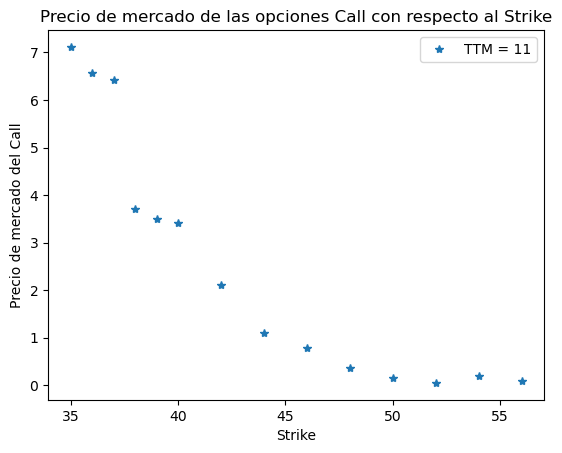

In [64]:
from matplotlib import pyplot as plt
CP = "C"
TTM = 11

Ks = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Strike.values
precios = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
plt.plot(Ks, precios,'*', label='TTM = '+str(TTM))


plt.legend()

plt.xlabel('Strike')
plt.ylabel('Precio de mercado del Call')
plt.title('Precio de mercado de las opciones Call con respecto al Strike')
    
plt.show()

In [59]:
precios



array([460.   , 413.   , 377.78 , 392.   , 325.   , 340.   , 319.999,
       294.   , 260.   , 234.   , 236.112, 219.513, 159.   , 127.649,
       106.151,  86.847,   6.502, 588.12 , 555.98 , 535.   , 510.   ,
       541.79 , 525.81 , 505.507, 471.69 , 479.   , 439.67 ,  55.336,
        39.464,  27.162,  20.929,  14.142,   9.281,   5.246,   3.998,
         3.288])

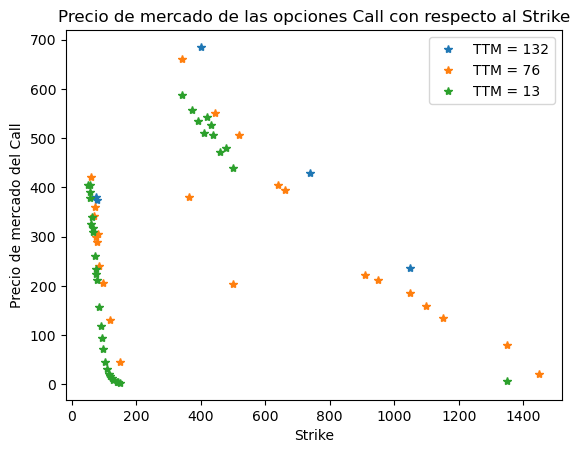

In [40]:
from matplotlib import pyplot as plt
CP = "C"
for TTM in TTMs:
    Ks = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Strike.values
    precios = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
    plt.plot(Ks, precios,'*', label='TTM = '+str(TTM))


plt.legend()

plt.xlabel('Strike')
plt.ylabel('Precio de mercado del Call')
plt.title('Precio de mercado de las opciones Call con respecto al Strike')
    
plt.show()
    

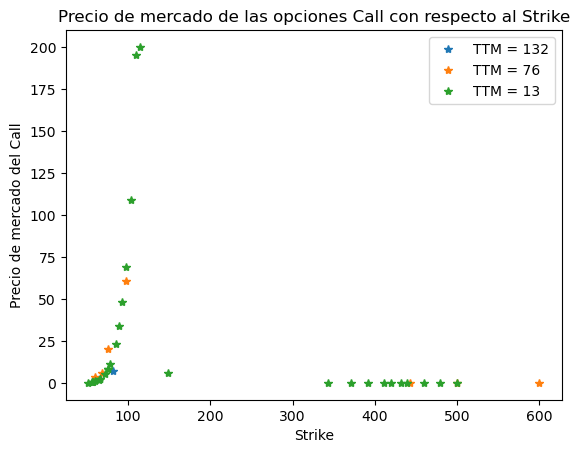

In [41]:

CP = "P"
for TTM in TTMs:
    Ks = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Strike.values
    precios = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
    plt.plot(Ks, precios,'*', label='TTM = '+str(TTM))


plt.legend()

plt.xlabel('Strike')
plt.ylabel('Precio de mercado del Call')
plt.title('Precio de mercado de las opciones Call con respecto al Strike')
    
plt.show()

In [42]:
Ks = list(set(panel_opciones_ggal_byma_limpio.Strike.values))

Ks[0:2]

[640.0, 129.15]

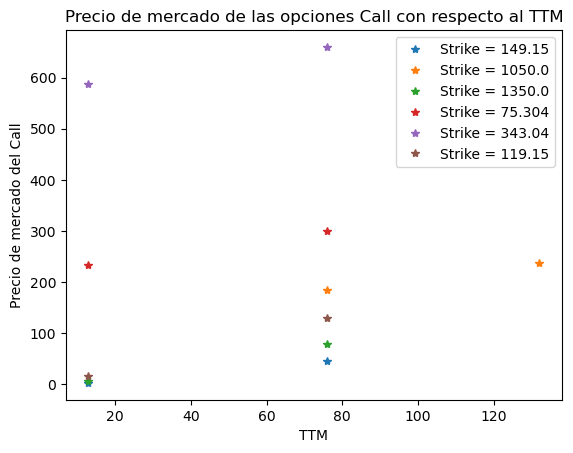

array([134.5])

In [43]:

CP = "C"
for K in Ks:
    TTMs = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.Strike == K) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].TTM.values
    precios = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.Strike == K) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
    if len(TTMs)>1:
        plt.plot(TTMs, precios,'*', label='Strike = '+str(K))

plt.legend()

plt.xlabel('TTM')
plt.ylabel('Precio de mercado del Call')
plt.title('Precio de mercado de las opciones Call con respecto al TTM')
    
plt.show()
panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.Strike == K) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
    

## (5) Pasar a Excel/CSV

In [ ]:
panel_opciones_byma_crudo = web_scraping_opciones_rava()
panel_opciones_byma_crudo.to_excel('Clase_1_panel_opciones_byma_crudo.xls')

panel_acciones_byma = obtener_panel_acciones()
panel_acciones_byma.to_excel('Clase_1_panel_acciones.xls')

panel_opciones_byma = obtener_panel_opciones_byma('', False)
panel_opciones_byma.to_excel('Clase_1_panel_opciones_byma.xls')

panel_opciones_byma_limpio = obtener_panel_opciones_byma('', True)
panel_opciones_byma_limpio.to_excel('Clase_1_panel_opciones_byma_limpio.xls')
panel_opciones_byma_limpio = obtener_panel_opciones_byma('', True)
panel_opciones_byma.to_excel('Clase_1_panel_opciones_byma.xls')
panel_opciones_byma_limpio.to_excel('Clase_1_panel_opciones_byma_limpio.xls')
                                                  
                                                  

## (6) Comparando los paneles

In [ ]:
panel_opciones_ggal_rava_limpio = obtener_panel_opciones_byma('GGAL',True)

In [ ]:
panel_opciones_ggal_homebroker_limpio = panel_opciones_homebroker(personal_data, 'GGAL', True)

In [ ]:
panel_opciones_ggal_rava_limpio

In [ ]:
panel_opciones_ggal_homebroker_limpio

In [ ]:
# Inner es la interseccion
# Outer es la union

merged = pd.merge(panel_opciones_ggal_rava_limpio, panel_opciones_ggal_homebroker_limpio, on=["Especie", "Ticker", "CallPut", "Strike", "TTM"], how='inner')

merged = merged.rename(
            columns={'Spot_x':'Spot_rava','Spot_y':'Spot_HB', 'Last_x': 'Last_rava', 'Last_y': 'Last_HB', 'Close_x': 'Close_rava', 'Close_y': 'Close_HB','previous_close':'Close'}, inplace=False)
       
merged = merged[
            ['Especie','Ticker', 'Spot_rava', 'Spot_HB', 'CallPut', 'Strike', 'TTM', 'Last_rava', 'Last_HB','Close_rava','Close_HB']]


merged

Genero algunas columnas de diferencias

In [ ]:

merged['Dif_spot']=merged['Spot_rava']-merged['Spot_HB']
merged['Dif_last']=merged['Last_rava']-merged['Last_HB']
merged['Dif_close']=merged['Close_rava']-merged['Close_HB']

merged

